# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [142]:
# if plotnine is not installed in Jupter then use the following command to install it 


Running this project require the following imports 

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

# Customer dataset
Repeat all the above on the customer data set 


In [10]:
data_last = pd.read_csv('D:\Guc\ML\project/Customer data.csv')
data_last.head()


,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [30]:
data=pd.read_csv('D:\Guc\ML\project/Customer data.csv',usecols=['Age','Income'])
data.head()

,Age,Income
0,67,124670
1,22,150773
2,49,89210
3,45,171565
4,53,149031


In [36]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler ,MaxAbsScaler
scaled_data = MaxAbsScaler().fit(data).transform(data)
print(scaled_data)
data_scaled = pd.DataFrame(scaled_data, columns=data.columns)
data_scaled.head()

[[0.88157895 0.40298807]
 [0.28947368 0.4873644 ]
 [0.64473684 0.28836581]
 ...
 [0.40789474 0.27928266]
 [0.31578947 0.3166755 ]
 [0.32894737 0.22115049]]


,Age,Income
0,0.881579,0.402988
1,0.289474,0.487364
2,0.644737,0.288366
3,0.592105,0.554573
4,0.697368,0.481733


### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

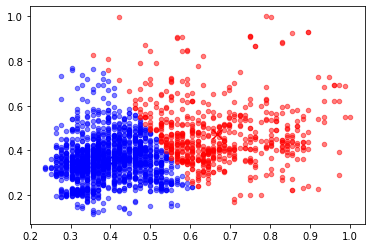

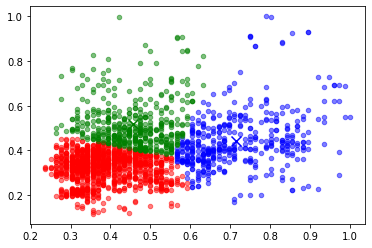

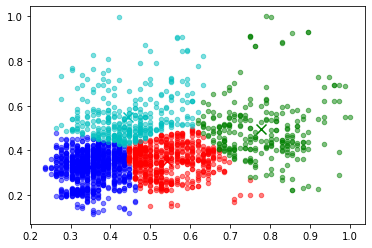

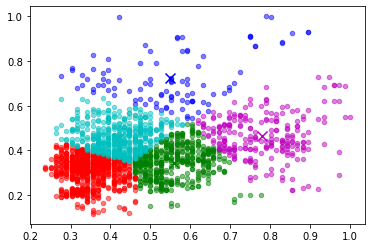

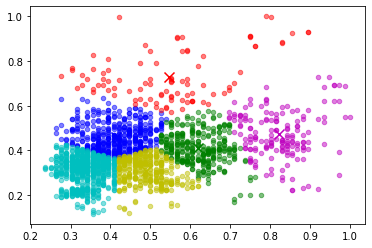

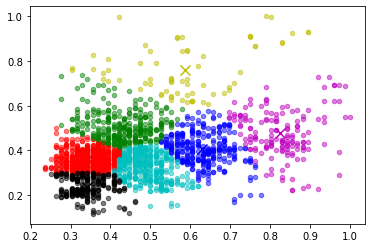

In [37]:
from sklearn.cluster import KMeans
import numpy as np

def display_cluster(X,km=[],cluster_centers=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            #print(i)
            plt.scatter(X[km==i,0],X[km==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(cluster_centers[i][0],cluster_centers[i][1],c = color[i], marker = 'x', s = 100)
disortion_array=[]
silhouette_scores=[]
K=[2,3,4,5,6,7]
for i in K:
    kmeans = KMeans(n_clusters=i, random_state=0).fit(scaled_data)
    plt.figure() 
    display_cluster(scaled_data,kmeans.labels_,kmeans.cluster_centers_,i)
    disortion_array.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(scaled_data,kmeans.labels_,metric='euclidean'))


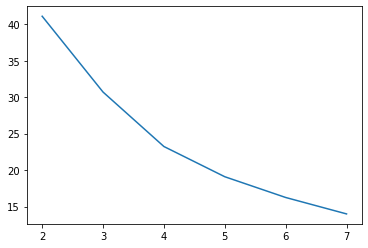

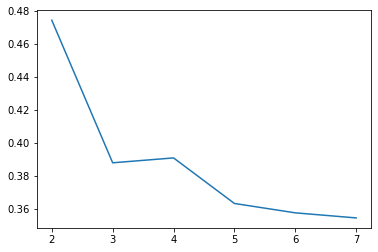

0.39086321298858245


In [39]:

#distortion function
plt.plot(K,disortion_array)   
plt.show() 
#silhouette score plotting
plt.plot(K,silhouette_scores)   
plt.show() 
#best silhouette score
best_silhouette_score_TOTAL=[]
best_silhouette_score_TOTAL.append(silhouette_scores[2])
print(silhouette_scores[2])

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

In [41]:
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


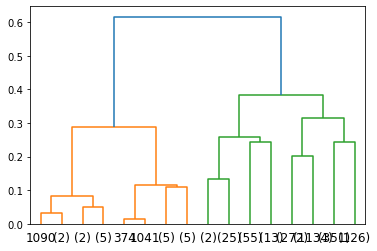

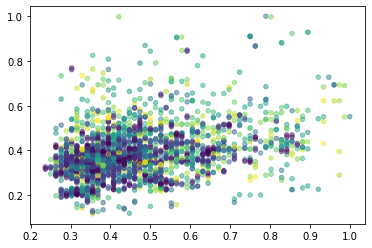

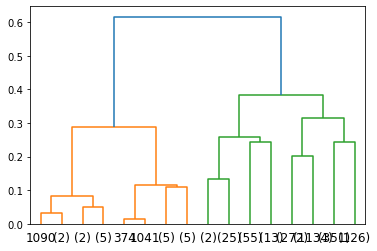

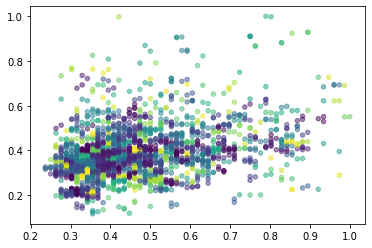

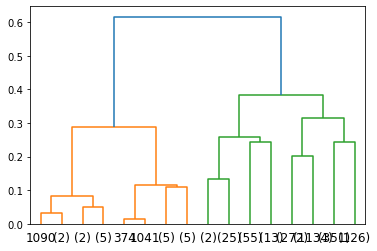

...

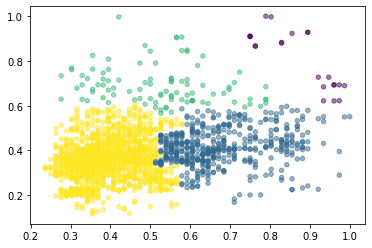

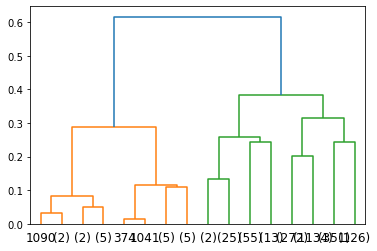

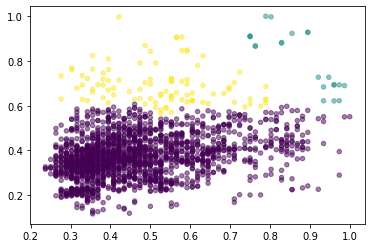

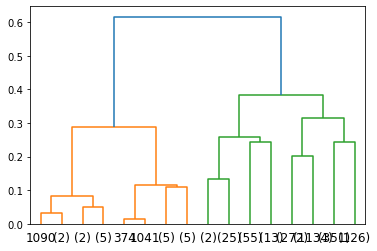

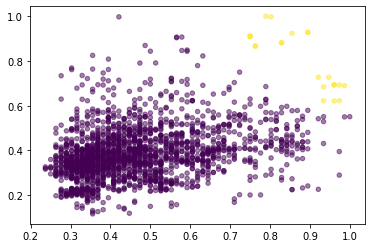

0.5920539914014232


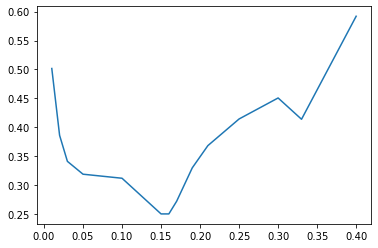

In [44]:
from sklearn.cluster import AgglomerativeClustering 
Distances=[0.01,0.02,0.03,0.05,0.1,0.15,0.16,0.17,0.19,0.21,0.25,0.3,0.33,0.4]
#color = 'brgcmyk'
best_silhouette_score_HC=[]
silhouette_scores_2=[]
for i in Distances:
    clustering = AgglomerativeClustering(n_clusters=None, affinity='euclidean', memory=None, connectivity=None, compute_full_tree='auto', linkage='average', distance_threshold=i).fit(scaled_data)
    plot_dendrogram(clustering, truncate_mode="level", p=3)
    plt.show()
    plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering.labels_ ,alpha = 0.5,s = 20)
    plt.show()
    silhouette_scores_2.append(silhouette_score(scaled_data, clustering.labels_, metric='euclidean'))
plt.plot(Distances,silhouette_scores_2)    
best_silhouette_score_HC.append(max(silhouette_scores_2))
print(max(silhouette_scores_2))
#print(best_silhouette_score)


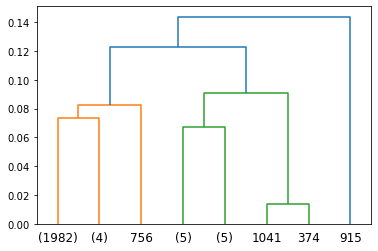

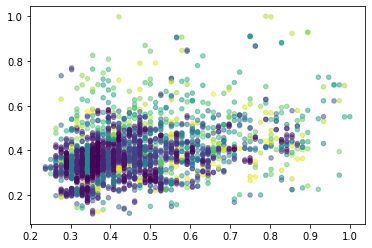

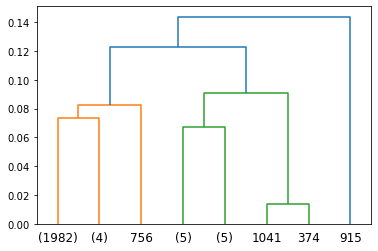

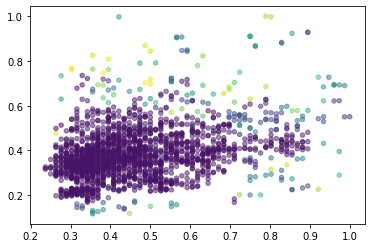

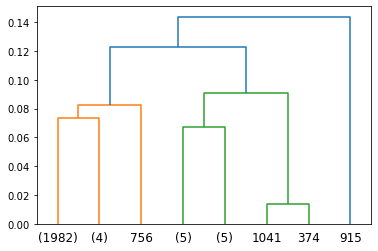

...

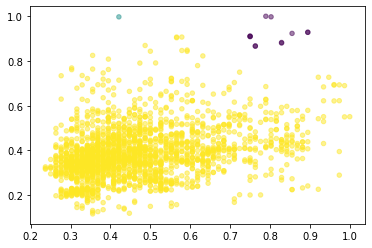

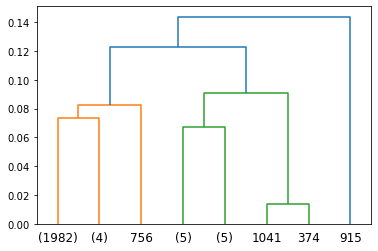

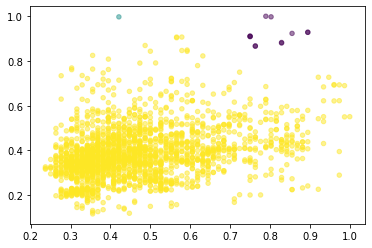

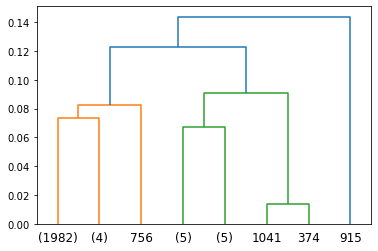

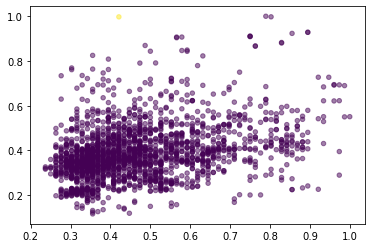

0.6055682665359668


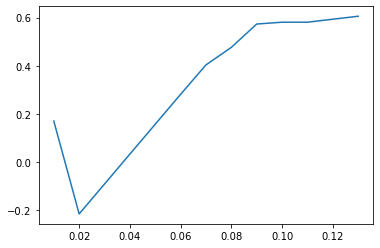

In [46]:
from sklearn.cluster import AgglomerativeClustering 
Distances=[0.01,0.02,0.06,0.07,0.08,0.09,0.1,0.11,0.13]
#color = 'brgcmyk'
silhouette_scores_3=[]
for i in Distances:
    clustering = AgglomerativeClustering(n_clusters=None, affinity='euclidean',  linkage='single', distance_threshold=i).fit(scaled_data)
    plot_dendrogram(clustering, truncate_mode="level", p=3)
    plt.show()
    plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering.labels_ ,alpha = 0.5,s = 20)
    plt.show()
    silhouette_scores_3.append(silhouette_score(scaled_data, clustering.labels_, metric='euclidean'))
plt.plot(Distances,silhouette_scores_3)    
best_silhouette_score_HC.append(max(silhouette_scores_3))
print(max(silhouette_scores_3))
#print(best_silhouette_score)

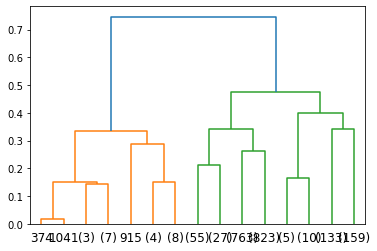

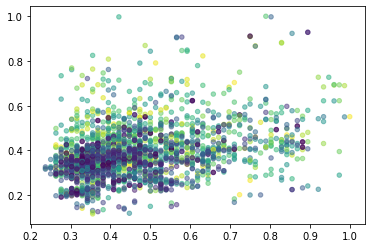

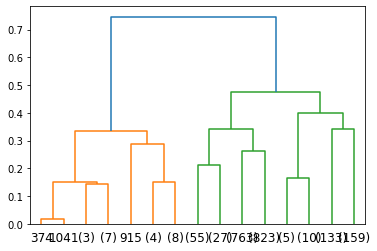

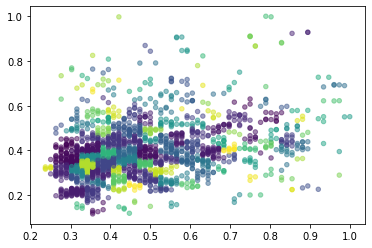

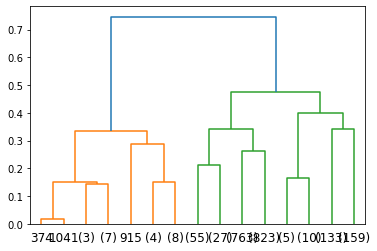

...

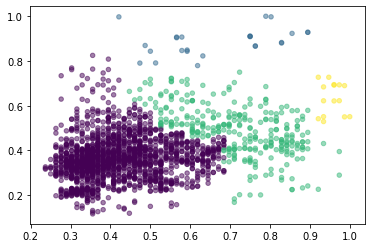

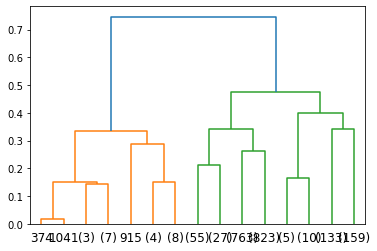

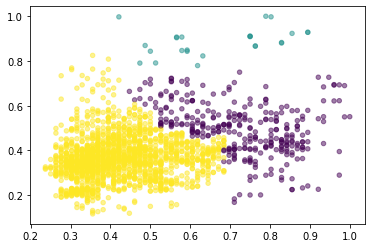

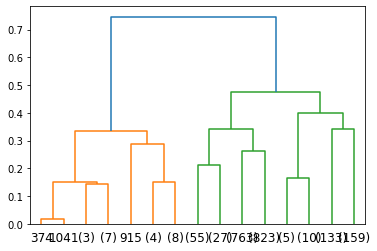

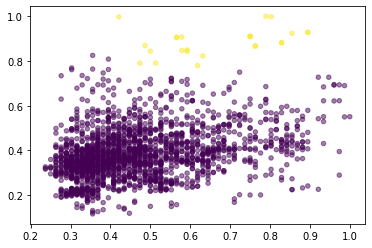

0.575196906014571


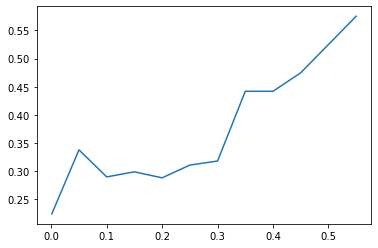

In [48]:
from sklearn.cluster import AgglomerativeClustering 
Distances=[0.001,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.55]
#color = 'brgcmyk'
silhouette_scores_4=[]
for i in Distances:
    clustering = AgglomerativeClustering(n_clusters=None, affinity='manhattan',  linkage='average', distance_threshold=i).fit(scaled_data)
    plot_dendrogram(clustering, truncate_mode="level", p=3)
    plt.show()
    plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering.labels_ ,alpha = 0.5,s = 20)
    plt.show()
    silhouette_scores_4.append(silhouette_score(scaled_data, clustering.labels_, metric='euclidean'))
plt.plot(Distances,silhouette_scores_4)    
best_silhouette_score_HC.append(max(silhouette_scores_4))
print(max(silhouette_scores_4))
#print(best_silhouette_score)

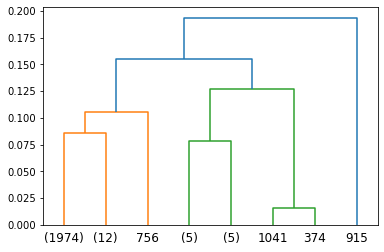

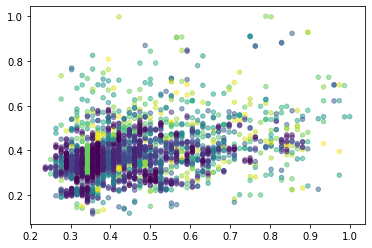

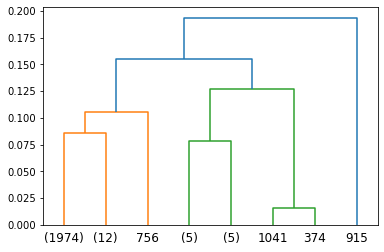

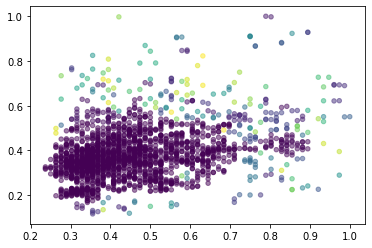

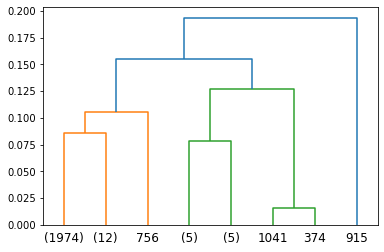

...

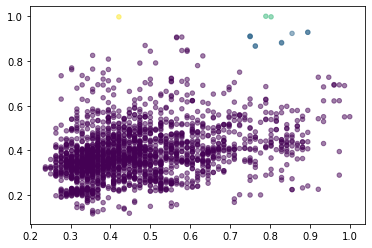

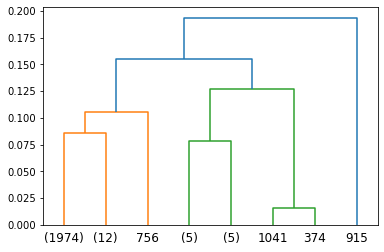

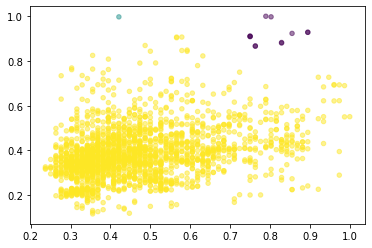

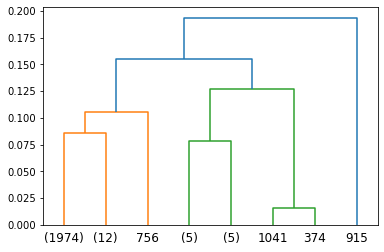

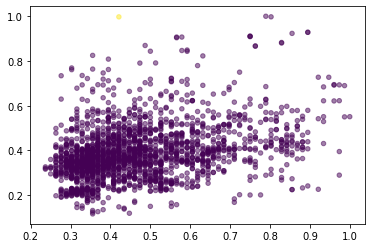

0.6055682665359668


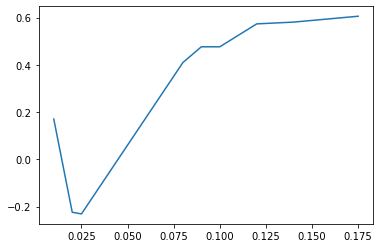

In [50]:
from sklearn.cluster import AgglomerativeClustering 
Distances=[0.01,0.02,0.025,0.08,0.09,0.1,0.120,0.14,0.175]
#color = 'brgcmyk'
silhouette_scores_5=[]
for i in Distances:
    clustering = AgglomerativeClustering(n_clusters=None, affinity='manhattan',  linkage='single', distance_threshold=i).fit(scaled_data)
    plot_dendrogram(clustering, truncate_mode="level", p=3)
    plt.show()
    plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering.labels_ ,alpha = 0.5,s = 20)
    plt.show()
    silhouette_scores_5.append(silhouette_score(scaled_data, clustering.labels_, metric='euclidean'))
plt.plot(Distances,silhouette_scores_5)    
best_silhouette_score_HC.append(max(silhouette_scores_5))
print(max(silhouette_scores_5))
#print(best_silhouette_score)

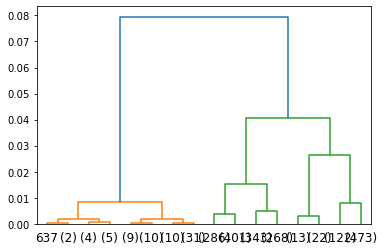

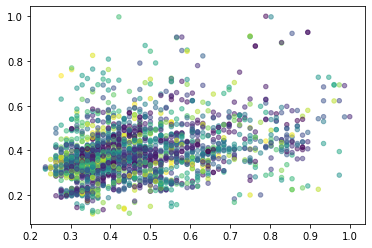

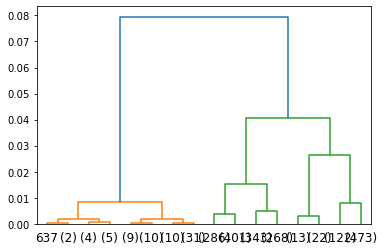

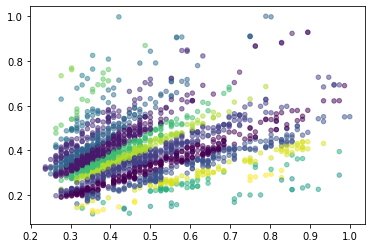

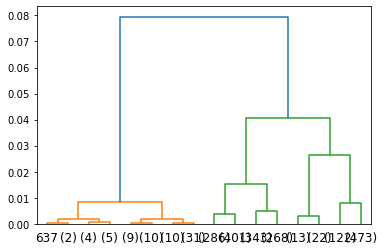

...

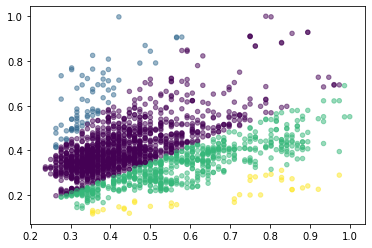

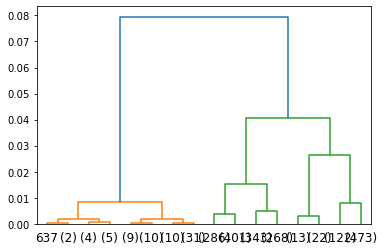

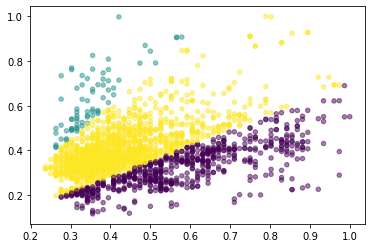

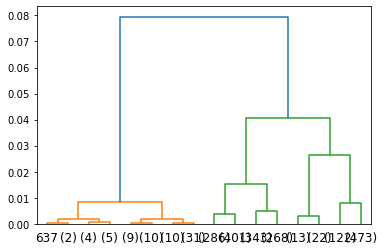

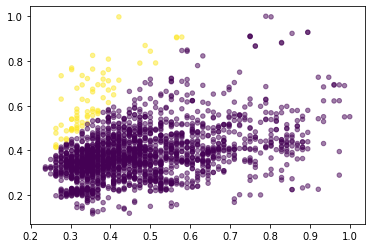

0.3079210674257166


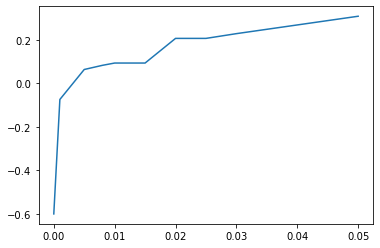

In [52]:
from sklearn.cluster import AgglomerativeClustering 
Distances=[0.000001,0.001,0.005,0.008,0.01,0.015,0.02,0.025,0.03,0.05]
#color = 'brgcmyk'
silhouette_scores_6=[]
for i in Distances:
    clustering = AgglomerativeClustering(n_clusters=None, affinity='cosine',  linkage='average', distance_threshold=i).fit(scaled_data)
    plot_dendrogram(clustering, truncate_mode="level", p=3)
    plt.show()
    plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering.labels_ ,alpha = 0.5,s = 20)
    plt.show()
    silhouette_scores_6.append(silhouette_score(scaled_data, clustering.labels_, metric='euclidean'))
plt.plot(Distances,silhouette_scores_6)    
best_silhouette_score_HC.append(max(silhouette_scores_6))
print(max(silhouette_scores_6))
#print(best_silhouette_score)

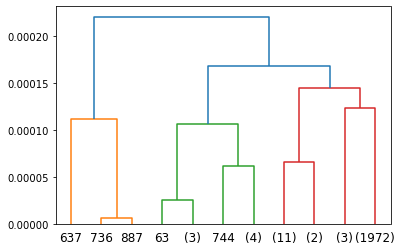

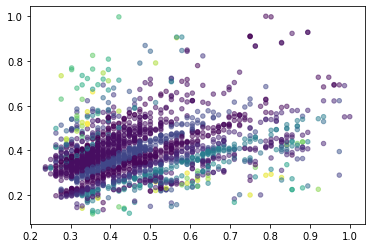

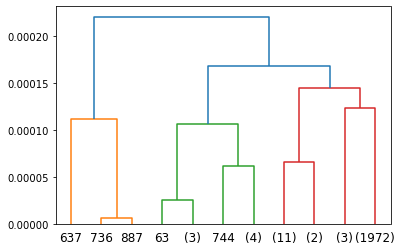

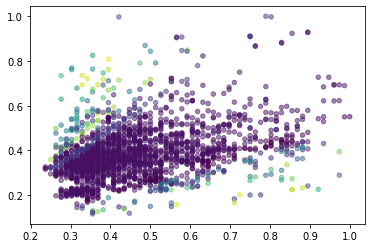

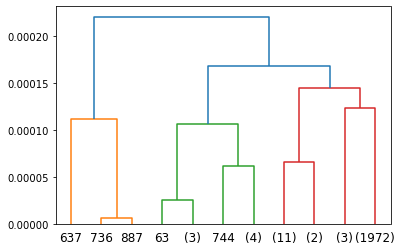

...

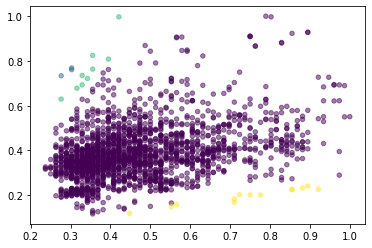

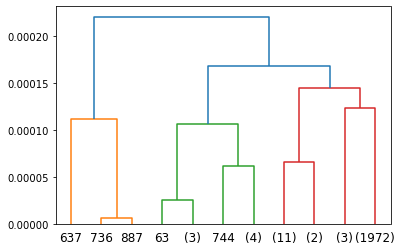

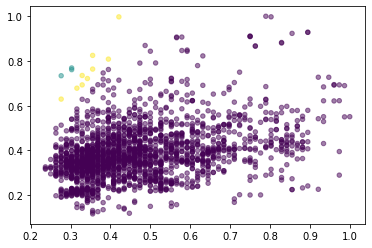

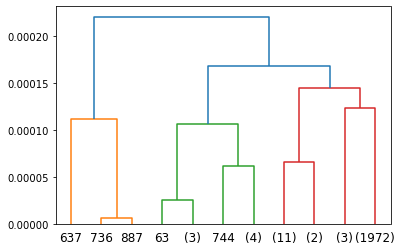

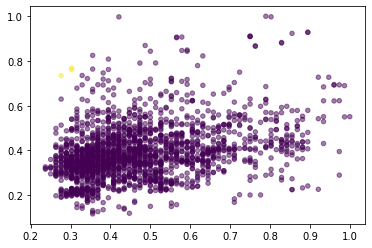

0.4414243001759823
[0.5920539914014232, 0.6055682665359668, 0.575196906014571, 0.6055682665359668, 0.3079210674257166, 0.4414243001759823]


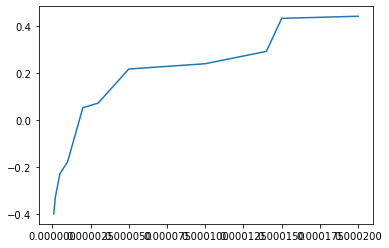

In [54]:
from sklearn.cluster import AgglomerativeClustering 
Distances=[0.000001,0.000002,0.000005,0.00001,0.00002,0.00003,0.00005,0.0001,0.00014,0.00015,0.0002]
#color = 'brgcmyk'
silhouette_scores_7=[]
for i in Distances:
    clustering = AgglomerativeClustering(n_clusters=None, affinity='cosine',  linkage='single', distance_threshold=i).fit(scaled_data)
    plot_dendrogram(clustering, truncate_mode="level", p=3)
    plt.show()
    plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering.labels_ ,alpha = 0.5,s = 20)
    plt.show()
    silhouette_scores_7.append(silhouette_score(scaled_data, clustering.labels_, metric='euclidean'))
plt.plot(Distances,silhouette_scores_7)    
best_silhouette_score_HC.append(max(silhouette_scores_7))
print(max(silhouette_scores_7))
print(best_silhouette_score_HC)


In [55]:
# best silhouette_score hierarchical clustering
print(best_silhouette_score_HC)
print(max(best_silhouette_score_HC))


[0.5920539914014232, 0.6055682665359668, 0.575196906014571, 0.6055682665359668, 0.3079210674257166, 0.4414243001759823]
0.6055682665359668


[0.5920539914014232, 0.6055682665359668, 0.575196906014571, 0.6055682665359668, 0.3079210674257166, 0.4414243001759823]
0.6055682665359668


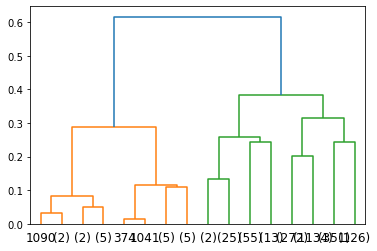

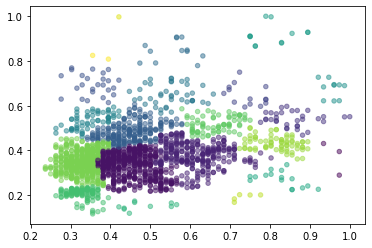

In [57]:
# best silhouette_score hierarchical clustering
print(best_silhouette_score_HC)
print(max(best_silhouette_score_HC))
# so that (best parameters are Affinity=ecuilidian or manhattein, Linkage=single, distance_threshold=0.13 or (0.175 for manhattin)
from sklearn.cluster import AgglomerativeClustering 


clustering = AgglomerativeClustering(n_clusters=None, affinity='euclidean', memory=None, connectivity=None, compute_full_tree='auto', linkage='average', distance_threshold=0.13).fit(scaled_data)
plot_dendrogram(clustering, truncate_mode="level", p=3)
plt.show()
plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering.labels_ ,alpha = 0.5,s = 20)
plt.show()

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

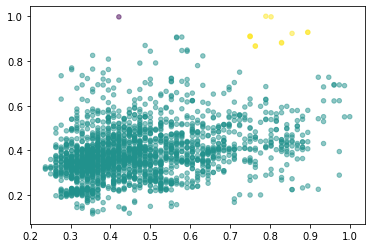

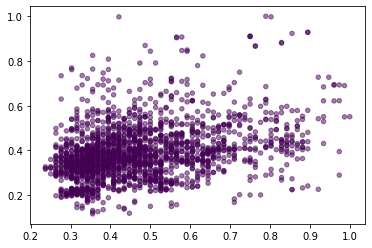

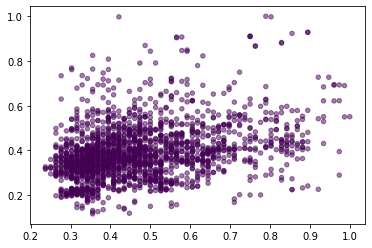

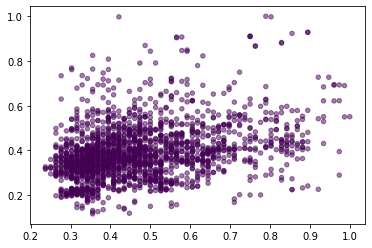

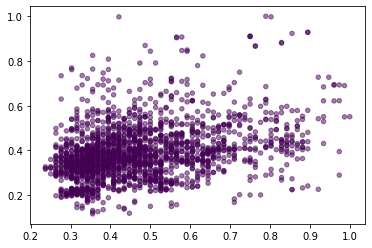

...

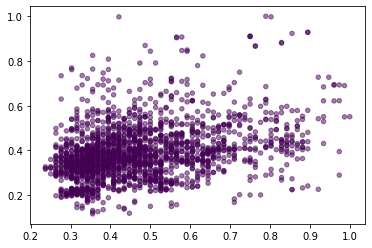

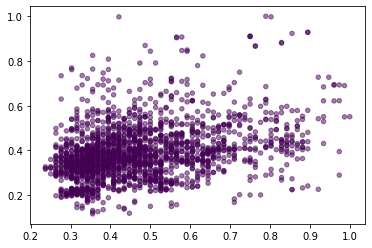

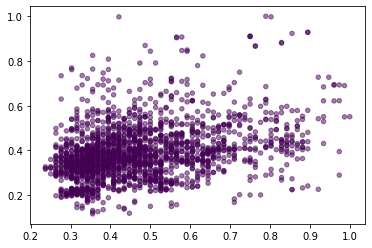

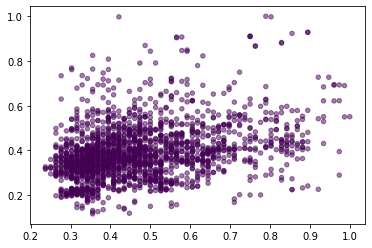

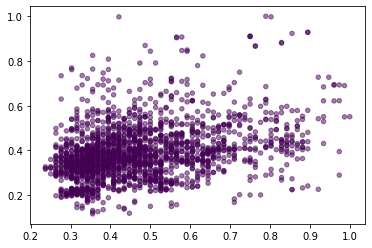

0.5807809409848368


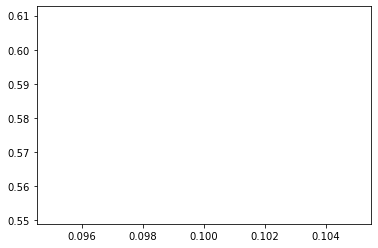

In [59]:
#Best_silhouette_score_DB  for min_sample = 5
from sklearn.cluster import DBSCAN
Best_silhouette_score_DB_5=[]
#EPS=[0.1,0.5,1,1.5,2,2.5,3]
EPS=[0.1,0.4,0.7,1,1.3,1.6,1.9,2.1,2.4,2.7,3]
Min_Samples=5
EPS_1=[]
Best_silhouette_score_DB_TOTAL=[]
for j in EPS:
        clustering_DB = DBSCAN(eps=j, min_samples=Min_Samples).fit(scaled_data)
        plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering_DB.labels_ ,alpha = 0.5,s = 20)
        plt.show()
        if np.unique(clustering_DB.labels_).shape[0]>1:
            Best_silhouette_score_DB_5.append(silhouette_score(scaled_data, clustering_DB.labels_, metric='euclidean'))
            EPS_1.append(j)
plt.plot(EPS_1,Best_silhouette_score_DB_5) 
print(max(Best_silhouette_score_DB_5))
Best_silhouette_score_DB_TOTAL.append(max(Best_silhouette_score_DB_5))





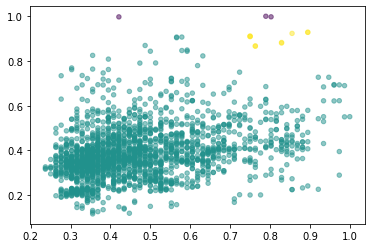

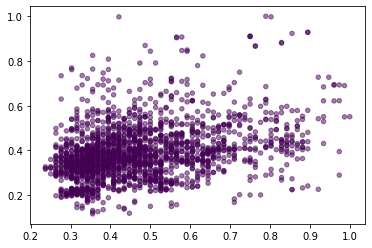

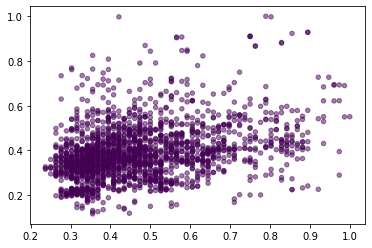

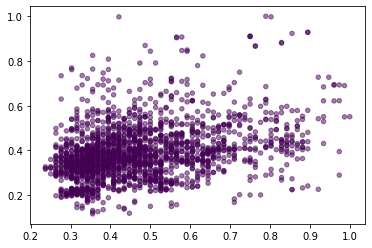

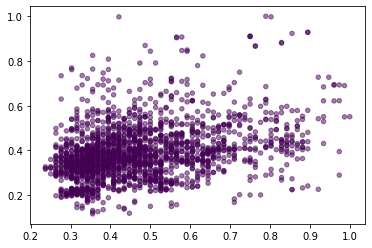

...

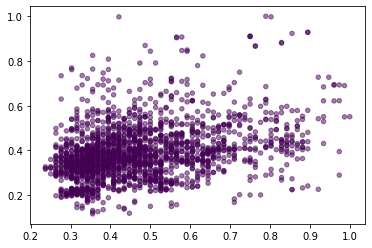

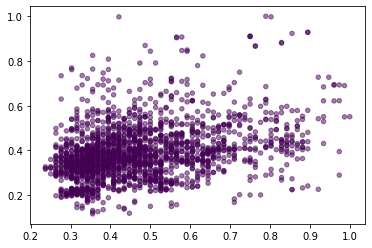

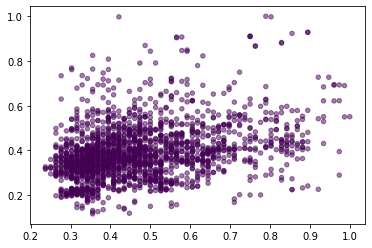

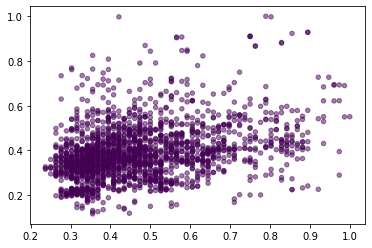

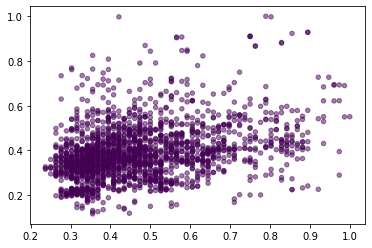

0.5963436734974734


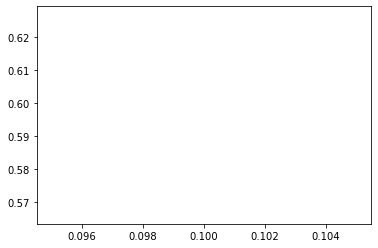

In [60]:
#Best_silhouette_score_DB  for min_sample = 10
from sklearn.cluster import DBSCAN
Best_silhouette_score_DB_10=[]
#EPS=[0.1,0.5,1,1.5,2,2.5,3]
EPS=[0.1,0.4,0.7,1,1.3,1.6,1.9,2.1,2.4,2.7,3]
Min_Samples=10
EPS_1=[]

for j in EPS:
        clustering_DB = DBSCAN(eps=j, min_samples=Min_Samples).fit(scaled_data)
        plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering_DB.labels_ ,alpha = 0.5,s = 20)
        plt.show()
        if np.unique(clustering_DB.labels_).shape[0]>1:
            Best_silhouette_score_DB_10.append(silhouette_score(scaled_data, clustering_DB.labels_, metric='euclidean'))
            EPS_1.append(j)
plt.plot(EPS_1,Best_silhouette_score_DB_10) 
print(max(Best_silhouette_score_DB_10))
Best_silhouette_score_DB_TOTAL.append(max(Best_silhouette_score_DB_10))




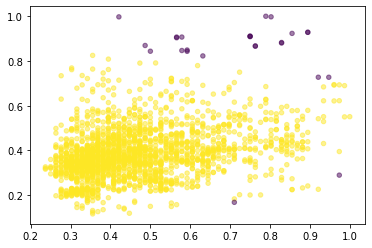

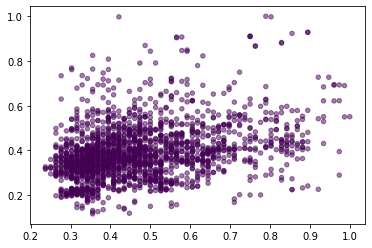

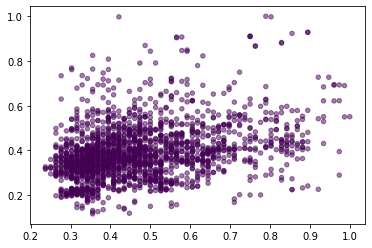

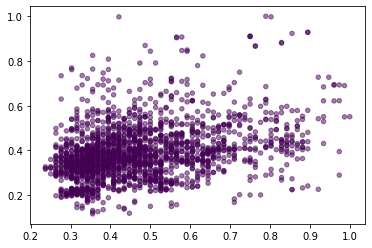

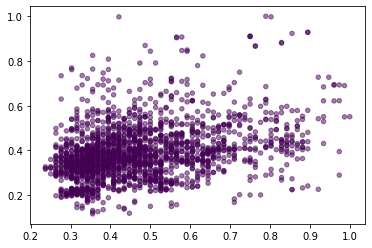

...

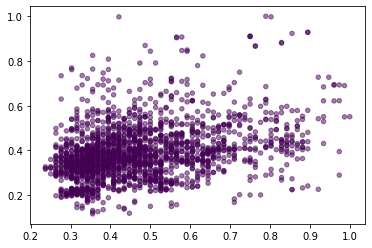

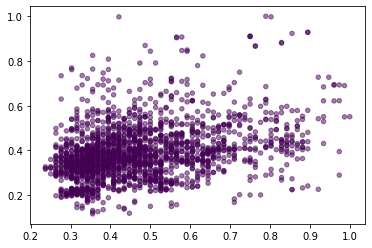

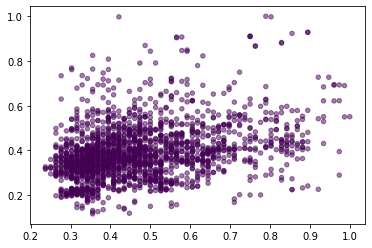

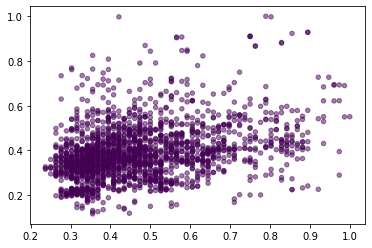

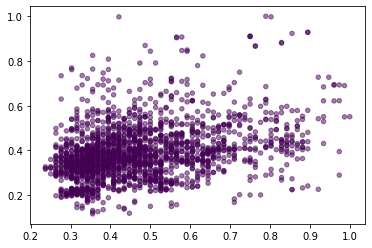

0.5794963054193106


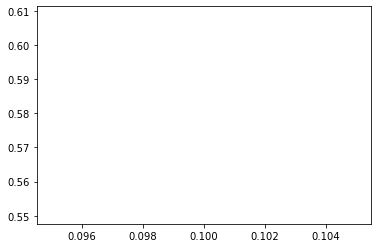

In [61]:
#Best_silhouette_score_DB  for min_sample = 15
from sklearn.cluster import DBSCAN
Best_silhouette_score_DB_15=[]
#EPS=[0.1,0.5,1,1.5,2,2.5,3]
EPS=[0.1,0.4,0.7,1,1.3,1.6,1.9,2.1,2.4,2.7,3]
Min_Samples=15
EPS_1=[]

for j in EPS:
        clustering_DB = DBSCAN(eps=j, min_samples=Min_Samples).fit(scaled_data)
        plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering_DB.labels_ ,alpha = 0.5,s = 20)
        plt.show()
        if np.unique(clustering_DB.labels_).shape[0]>1:
            Best_silhouette_score_DB_15.append(silhouette_score(scaled_data, clustering_DB.labels_, metric='euclidean'))
            EPS_1.append(j)
plt.plot(EPS_1,Best_silhouette_score_DB_15) 
print(max(Best_silhouette_score_DB_15))
Best_silhouette_score_DB_TOTAL.append(max(Best_silhouette_score_DB_15))




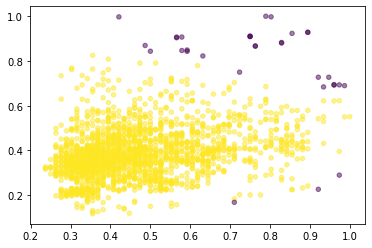

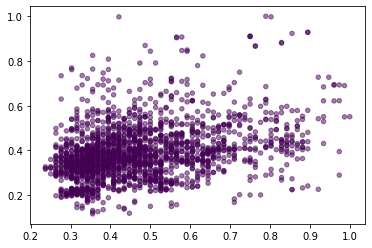

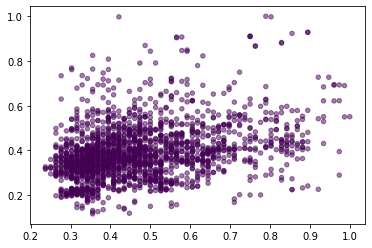

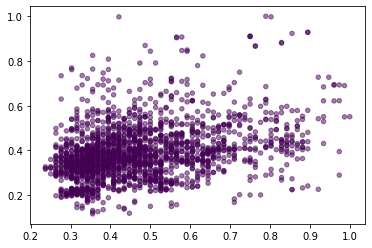

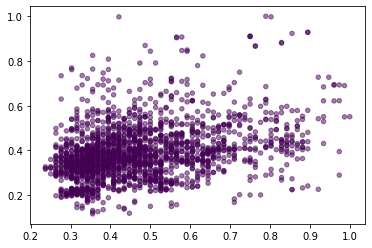

...

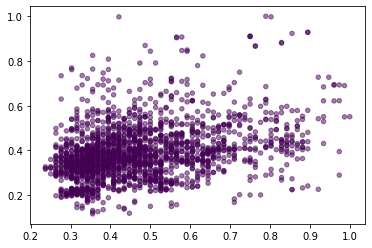

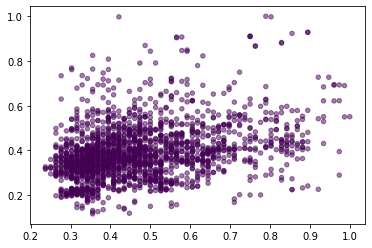

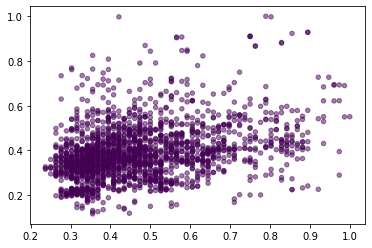

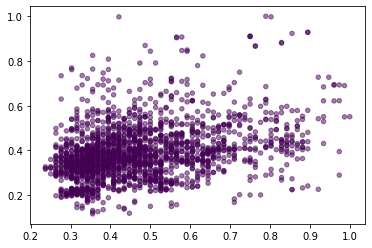

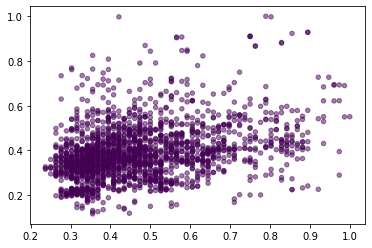

0.5781044199268677


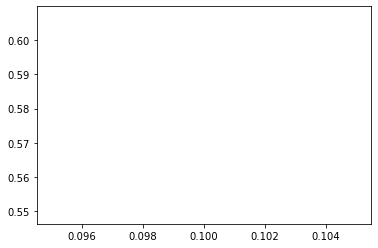

In [62]:
#Best_silhouette_score_DB  for min_sample = 20
from sklearn.cluster import DBSCAN
Best_silhouette_score_DB_20=[]
#EPS=[0.1,0.5,1,1.5,2,2.5,3]
EPS=[0.1,0.4,0.7,1,1.3,1.6,1.9,2.1,2.4,2.7,3]
Min_Samples=20
EPS_1=[]

for j in EPS:
        clustering_DB = DBSCAN(eps=j, min_samples=Min_Samples).fit(scaled_data)
        plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering_DB.labels_ ,alpha = 0.5,s = 20)
        plt.show()
        if np.unique(clustering_DB.labels_).shape[0]>1:
            Best_silhouette_score_DB_20.append(silhouette_score(scaled_data, clustering_DB.labels_, metric='euclidean'))
            EPS_1.append(j)
plt.plot(EPS_1,Best_silhouette_score_DB_20) 
print(max(Best_silhouette_score_DB_20))
Best_silhouette_score_DB_TOTAL.append(max(Best_silhouette_score_DB_20))



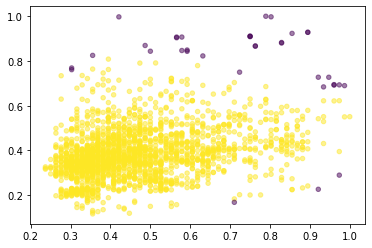

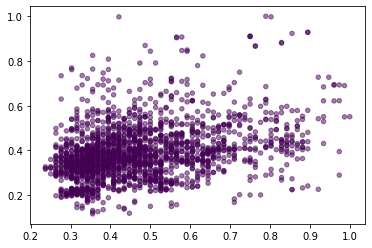

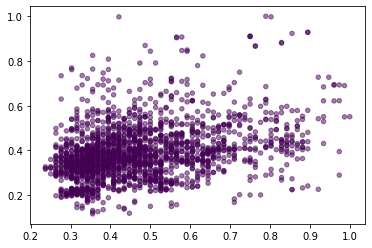

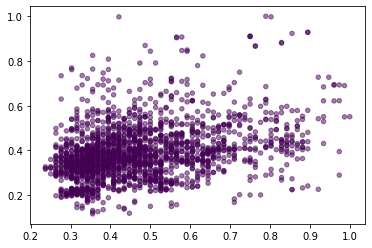

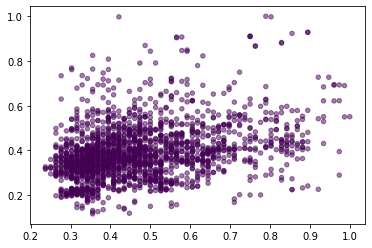

...

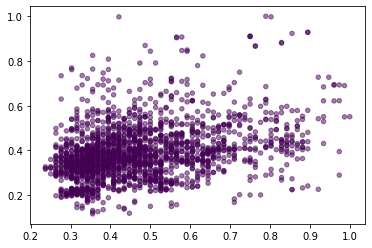

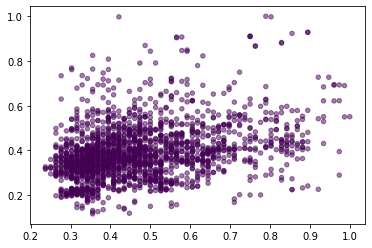

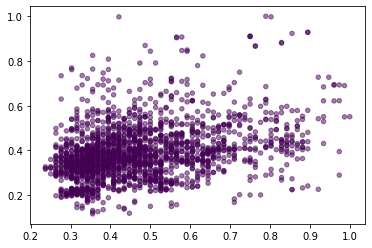

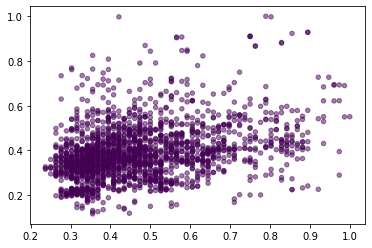

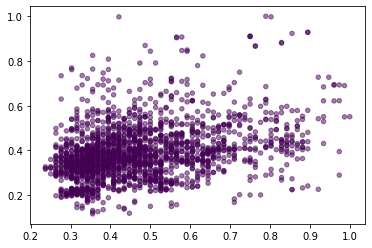

0.5740605284031925


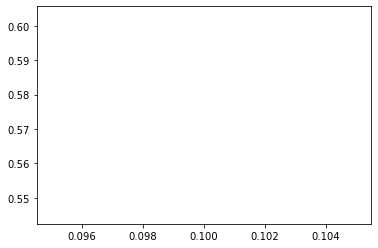

In [64]:
#Best_silhouette_score_DB  for min_sample = 25
from sklearn.cluster import DBSCAN
Best_silhouette_score_DB_25=[]
#EPS=[0.1,0.5,1,1.5,2,2.5,3]
EPS=[0.1,0.4,0.7,1,1.3,1.6,1.9,2.1,2.4,2.7,3]
Min_Samples=25
EPS_1=[]

for j in EPS:
        clustering_DB = DBSCAN(eps=j, min_samples=Min_Samples).fit(scaled_data)
        plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering_DB.labels_ ,alpha = 0.5,s = 20)
        plt.show()
        if np.unique(clustering_DB.labels_).shape[0]>1:
            Best_silhouette_score_DB_25.append(silhouette_score(scaled_data, clustering_DB.labels_, metric='euclidean'))
            EPS_1.append(j)
plt.plot(EPS_1,Best_silhouette_score_DB_25) 
print(max(Best_silhouette_score_DB_25))
Best_silhouette_score_DB_TOTAL.append(max(Best_silhouette_score_DB_25))



In [65]:
#Best_silhouette_score_DB  for all
print(Best_silhouette_score_DB_TOTAL)
print(max(Best_silhouette_score_DB_TOTAL))

[0.5807809409848368, 0.5963436734974734, 0.5794963054193106, 0.5781044199268677, 0.5740605284031925]
0.5963436734974734


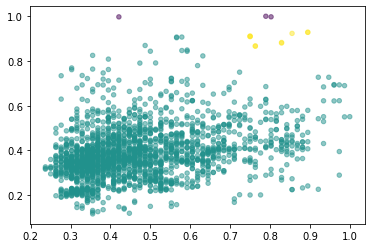

0.5963436734974734


In [67]:
#from the previous trails Best_silhouette_score_DB   for all is at (EPS=0.1) and (Min_score=10) so i will choose 20 for example
from sklearn.cluster import DBSCAN
Best_silhouette_score_DB_20=[]
#EPS=[0.1,0.5,1,1.5,2,2.5,3]
EPS=0.1
Min_Samples=10



clustering_DB = DBSCAN(eps=EPS, min_samples=Min_Samples).fit(scaled_data)
plt.scatter(scaled_data[:,0],scaled_data[:,1],c = clustering_DB.labels_ ,alpha = 0.5,s = 20)
plt.show()


print(max(Best_silhouette_score_DB_TOTAL))

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

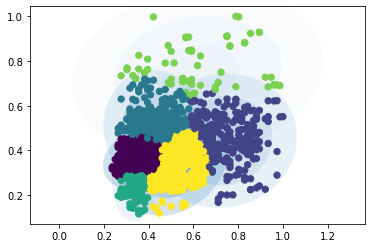

[[0.    0.998 0.    0.    0.002 0.   ]
 [0.109 0.001 0.866 0.003 0.013 0.008]
 [0.    0.341 0.011 0.    0.    0.648]
 ...
 [0.299 0.002 0.043 0.106 0.    0.549]
 [0.612 0.    0.01  0.354 0.    0.024]
 [0.019 0.    0.001 0.943 0.    0.036]]


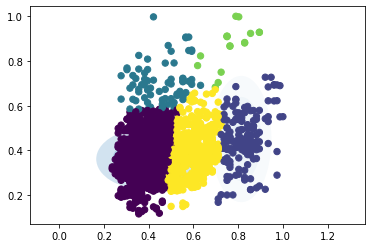

[[0.    0.999 0.    0.    0.    0.001]
 [0.757 0.    0.036 0.206 0.    0.   ]
 [0.002 0.049 0.    0.001 0.    0.949]
 ...
 [0.717 0.    0.    0.248 0.    0.035]
 [0.744 0.    0.    0.255 0.    0.001]
 [0.718 0.    0.    0.28  0.    0.002]]


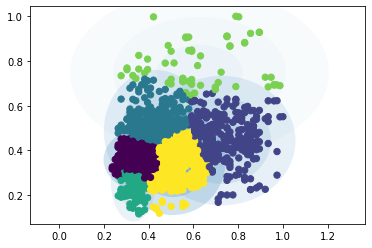

[[0.    0.997 0.    0.    0.003 0.   ]
 [0.153 0.001 0.792 0.003 0.007 0.044]
 [0.    0.3   0.005 0.    0.    0.694]
 ...
 [0.448 0.002 0.046 0.122 0.    0.382]
 [0.583 0.    0.014 0.381 0.    0.022]
 [0.018 0.    0.002 0.963 0.    0.017]]


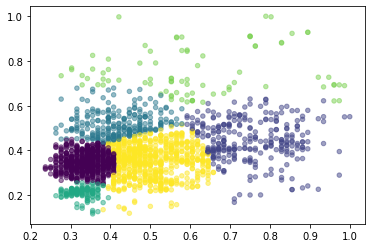

[[0.    0.961 0.    0.    0.039 0.   ]
 [0.064 0.    0.798 0.    0.029 0.109]
 [0.    0.317 0.006 0.    0.018 0.66 ]
 ...
 [0.415 0.    0.03  0.005 0.002 0.548]
 [0.94  0.    0.012 0.002 0.001 0.046]
 [0.034 0.    0.001 0.94  0.    0.025]]


In [69]:
from matplotlib.patches import Ellipse

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)






covariance_type=['full','tied','diag','spherical']
for i in covariance_type:
    GMM=GaussianMixture(n_components=6,covariance_type=i,random_state=42).fit(scaled_data)
    if i == 'spherical':
        plt.scatter(scaled_data[:,0],scaled_data[:,1],c = GMM.predict(scaled_data) ,alpha = 0.5,s = 20)
        plt.show()
        probs = GMM.predict_proba(scaled_data)
        print(probs[:].round(3))
    else:
        
        plot_gmm(GMM,scaled_data)
        plt.show()
        probs = GMM.predict_proba(scaled_data)
        print(probs[:].round(3))
    